<a href="https://colab.research.google.com/github/SAIFIANS/DS_Linear_Regression/blob/main/Simple_Linear_Regression_and_Multiple_Linear_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Regression

##Regression Analysis

*   Regression Analysis + Correlation = Predict Future performance using past results
*  While corelation explains the degree of linear r/s that exists b/w two variables, Regression defines the r/s more precisely
*  Regression Analysis is a tool that uses data on relevant variables to develop a prediction equation, or model
*  It generates an equation to describe the statistical r/s b/w one or more predictors and the response variable and to predict new observations.

#Simple Linear Regression

Simple linear regression is useful for finding r/s b/w two continous variables. One is predictor or independent variable and other is response or dependent variable.


**It looks for statistical r/s but not deterministic r/s.**

Y=B0 + B1X + e

Y= Dependent var.
X= Independent Var.
B0= Intercept
B1 = Slope


For Example, r/s b/w height and weight.

In Simple Linear Regression, a single variable "X" is used to define/predict Y

E.g Used Car cost = B1 +(B2) * (Miles driven) + E (error)

Simple linear Regression equation : Y = B1 + (B2) * (X) + E (error)

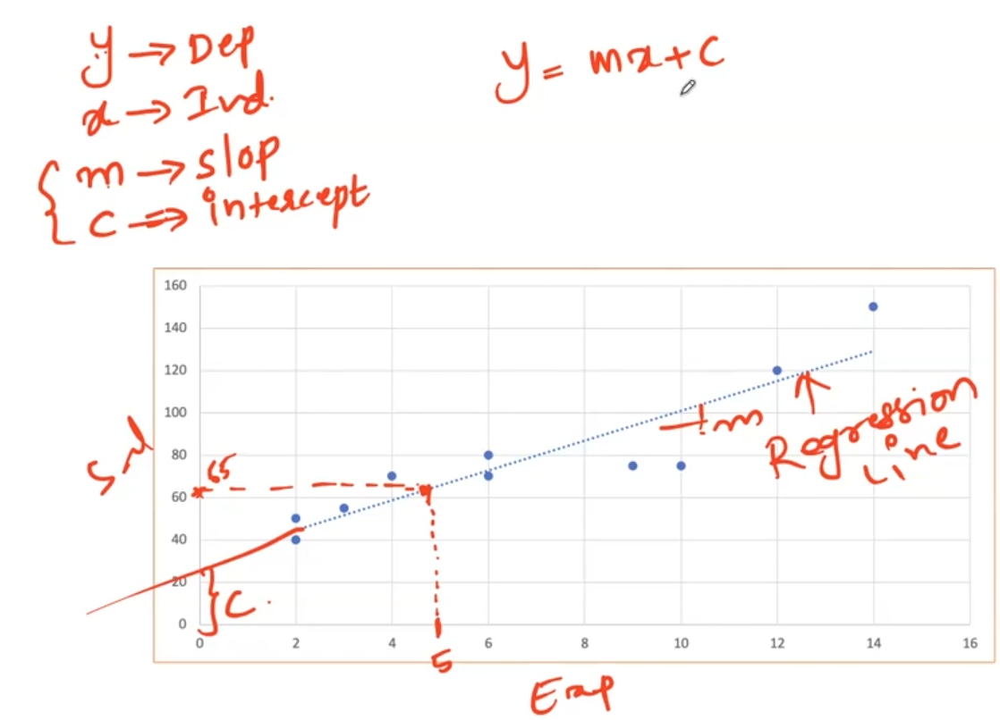

##The Best Line : Least Squares Method

*  The Line of our interest is :

Sunday = B0 + B1 Daily + e

or

Y = B0 + B1 X + e

To calculate B1 and B0 -

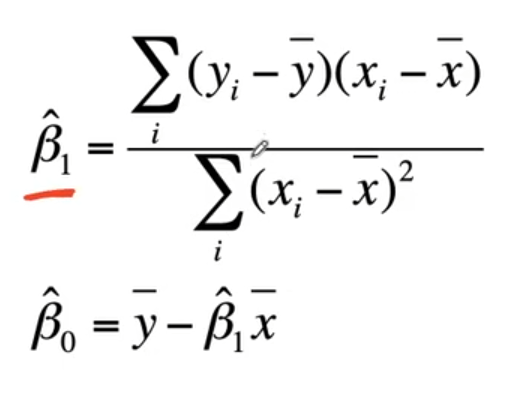

## Coefficient Of Determination R^2

In order to validate whether the regression equation is good to go or not, we need R2.

The range for R2 values is 0 to 1.

If R2 value is near to 0, then that equation is bad for us.

If R2 value is more than 0.65, then that is okay kind of equation.

If R2 value is more than 0.7, then that is good equation.

If R2 value is more than 0.8, then that is an Very Good equation.

If R2 value is more than 0.9, then that is an Excellent equation.

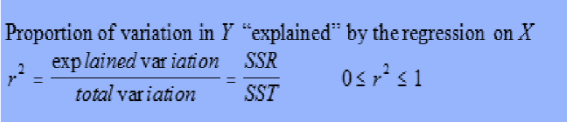

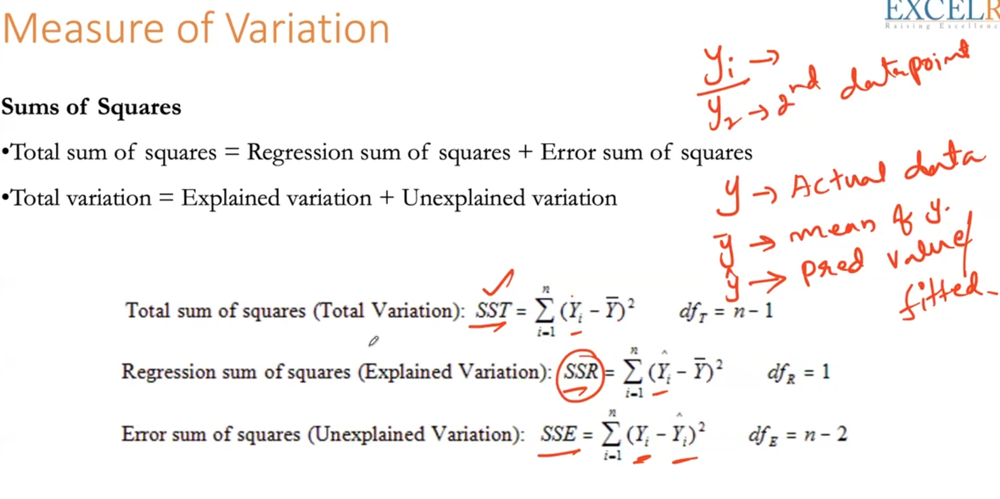

##Python Code for Simple Linear Regression Model

###Importing data and general checks

In [ ]:
import pandas as pd
data = pd.read_csv("NewspaperData.csv")
data.head()

,Newspaper,daily,sunday
0,Baltimore Sun,391.952,488.506
1,Boston Globe,516.981,798.298
2,Boston Herald,355.628,235.084
3,Charlotte Observer,238.555,299.451
4,Chicago Sun Times,537.780,559.093


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34 entries, 0 to 33
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Newspaper  34 non-null     object 
 1   daily      34 non-null     float64
 2   sunday     34 non-null     float64
dtypes: float64(2), object(1)
memory usage: 944.0+ bytes


In [ ]:
data.corr()

<ipython-input-3-c44ded798807>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.corr()


,daily,sunday
daily,1.000000,0.958154
sunday,0.958154,1.000000


<ipython-input-5-53316fc3da8d>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['daily'])


<Axes: xlabel='daily', ylabel='Density'>

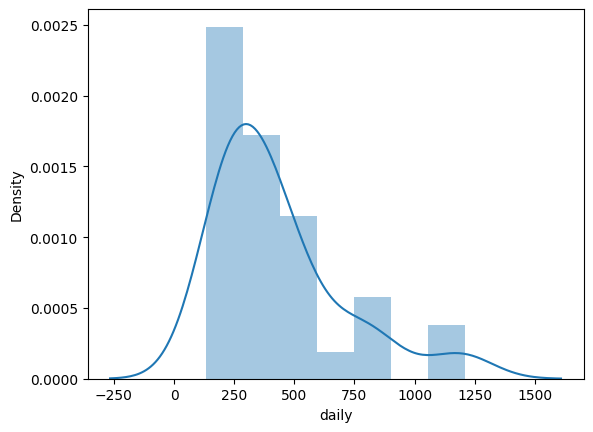

In [ ]:
import seaborn as sns
sns.distplot(data['daily'])

<ipython-input-6-03ab03f2f313>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['sunday'])


<Axes: xlabel='sunday', ylabel='Density'>

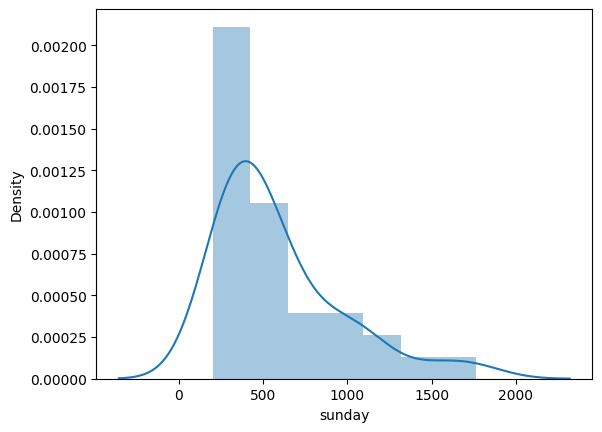

In [ ]:
import seaborn as sns
sns.distplot(data['sunday'])

###Fitting a linear regression Model

In [ ]:
import statsmodels.formula.api as smf
model = smf.ols("sunday~daily",data=data).fit()

In [ ]:
#Coefficients
model.params

Intercept    13.835630
daily         1.339715
dtype: float64

In [ ]:
#t values and p values
print(model.tvalues, "\n", model.pvalues)

Intercept     0.386427
daily        18.934840
dtype: float64 
 Intercept    7.017382e-01
daily        6.016802e-19
dtype: float64


If the pvalues is less than 0.05 than the parameter is significant to us else it can be disregarded.

In [ ]:
#R squared values
(model.rsquared)

0.9180596895873295

###Predict for new data point

In [ ]:
#Predict for 200 and 300 daily circulation
newdata = pd.Series([200,300])

In [ ]:
newdata

0    200
1    300
dtype: int64

In [ ]:
data_pred=pd.DataFrame(newdata,columns=["daily"])

In [ ]:
data_pred

,daily
0,200
1,300


In [ ]:
model.predict(data_pred)

0    281.778581
1    415.750057
dtype: float64

##In class Exercise
Waist Circumference Adipose Tissue

In [ ]:

data =pd.read_csv("WC_AT.csv")

In [ ]:
data.head()

,Waist,AT
0,74.75,25.72
1,72.60,25.89
2,81.80,42.60
3,83.95,42.80
4,74.65,29.84


In [ ]:
model=smf.ols("AT~Waist",data=data).fit()

In [ ]:
model.params

Intercept   -215.981488
Waist          3.458859
dtype: float64

In [ ]:
print(model.tvalues, "\n", model.pvalues)

Intercept    -9.909103
Waist        14.740376
dtype: float64 
 Intercept    8.197416e-17
Waist        1.618607e-27
dtype: float64


In [ ]:
(model.rsquared)

0.670036893052843

In [ ]:
newdata =pd.Series([65,150,40])

In [ ]:
data_pred=pd.DataFrame(newdata, columns=["Waist"])

In [ ]:
model.predict(data_pred)

#The AT for the 3rd paitent with the weight 40 does not seem right.
#Need to check the range of the data

0      8.844373
1    302.847421
2    -77.627112
dtype: float64

In [ ]:
data.describe()

,Waist,AT
count,109.000000,109.000000
mean,91.901835,101.894037
std,13.559116,57.294763
min,63.500000,11.440000
25%,80.000000,50.880000
50%,90.800000,96.540000
75%,104.000000,137.000000
max,121.000000,253.000000


As the data model range is from 63 to 121, therefore any valaues lying outside this range cannot be predicted using this model.

#Multiple Linear Regression

Multiple linear regression is used whenever there are more than one dependent variable involved.

y = B0+B1X1+B2X2.....BnXn



###Assumptions about the model

*  Linearity (Assumptions about the form of the model):
    *  Linear in parameters - The parameters should be linear in nature, i.e. they should not be in the exponent form such e^b1.

*  Assumptions about the errors :
    *  IID Normal (Independently and indentically distributed)
    * Zero mean
    * Constant Variance (Homoscedasticity)
    * Independent of each other

*  Assumptions about the predictors :
    *  Non-random
    * Measured without error
    * Linearly Independent of each other

*  Assumptions about the observations :
    * Equally reliable


###Building the Regression equation

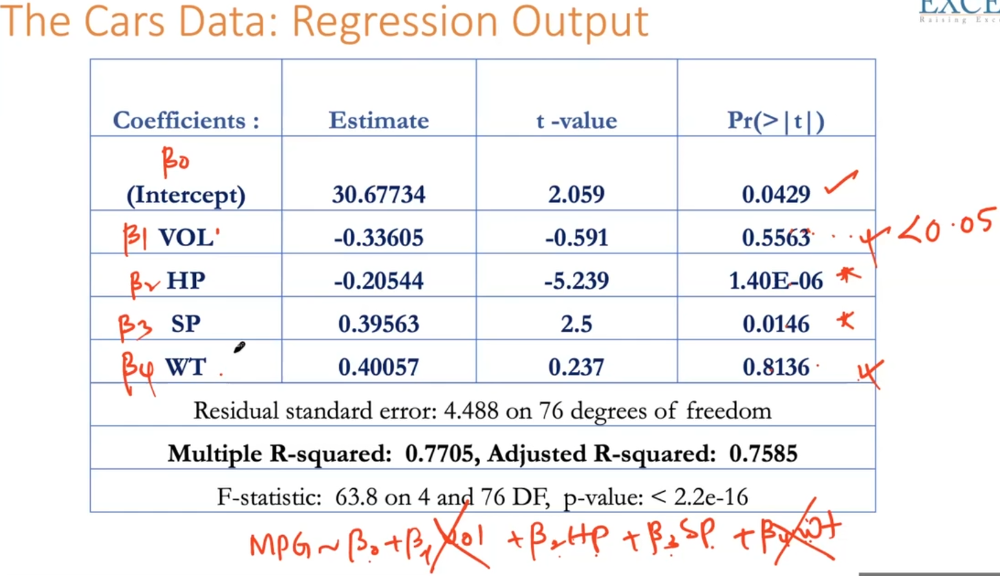

As the p-value of VOL and WT are more than 0.05, then we can disregard that.

However we know that VOL and WT are both significant by building a simple linear regression equation but upon building a regression equation of VOL and WT with MPG it again becomes insignificant, then it is called Collinearity.

When the Correlation b/w two variables is almost equal to 1 or -1, then they will create a problem in regression equation and that problem is known as Mutli Collinearity.


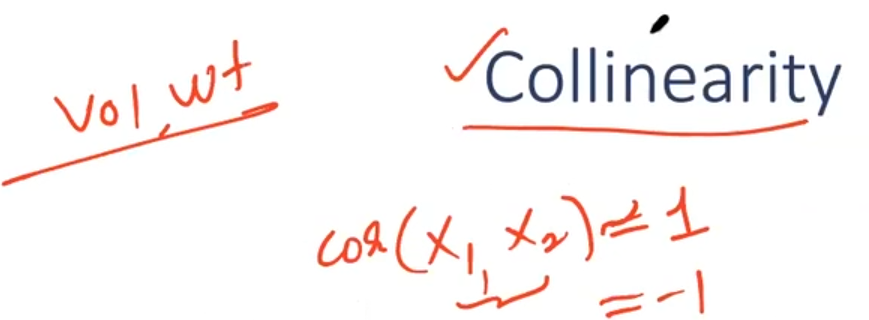

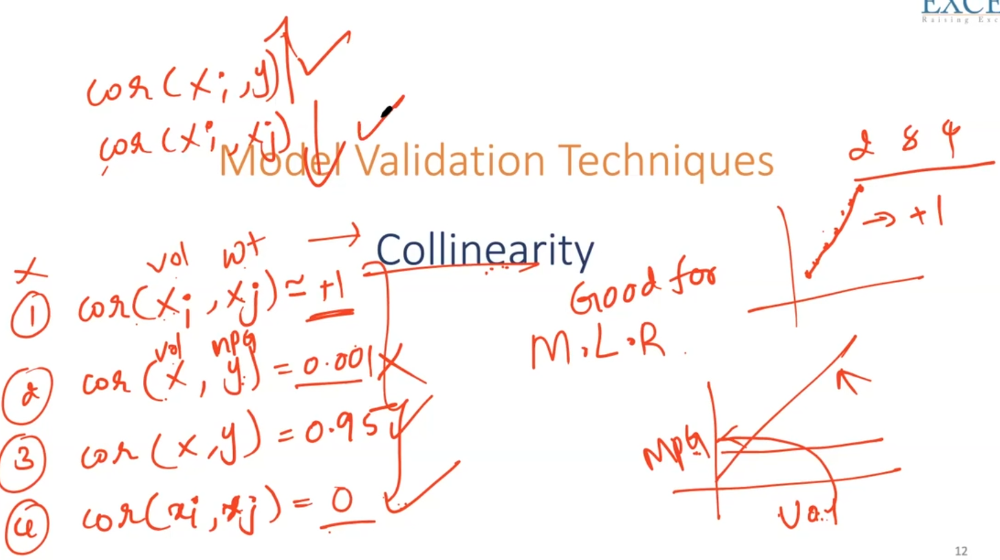

***Correlation b/w independent variable and dependent variable show be high.***

***Correlation b/w dependent variable and dependent variable show be low or else it will lead to collinearity.***

## Detection of Collinearity

###Correlation Matrix
If Correlation is +1 or -1 then it is going to cause Collinearity
### Variance Inflation Factor (VIF)
If VIF is greater than 20 then it is going to cause Collinearity

VIF is calculated using R2 value which is determined by building regression equations by making the variables as independent variable and rest as dependent variables in each case.

VIFvol = 1/(1-R²vol)

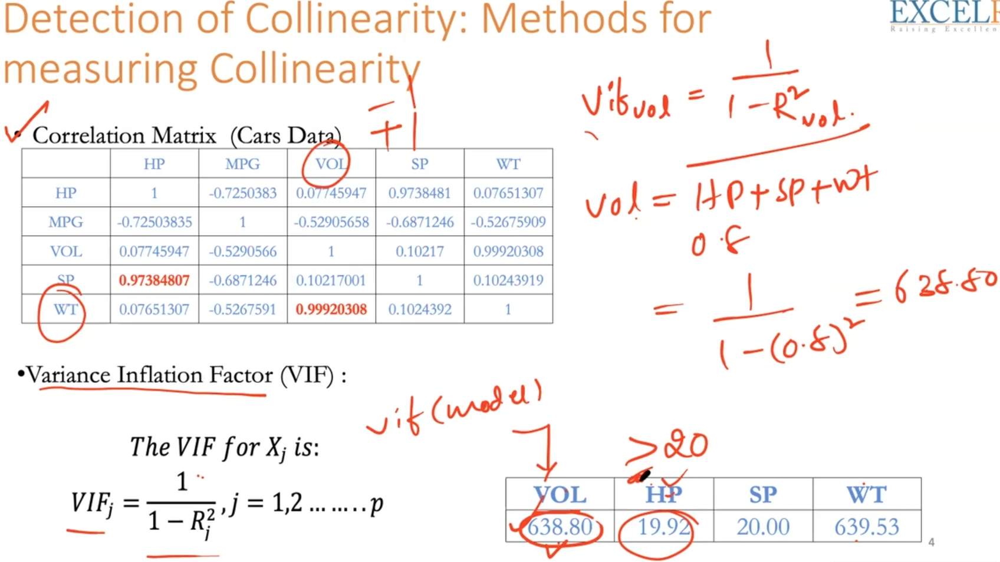

##Subset Selection



The next question would be to check which pair to include (Vol,SP),(WT,SP)

Best subset will have High R2 value and low AIC value.

This is done using -

~ Based on R2 (R Square)

~ Based on AIC (Akaike information Criteria)
AIC: 2p-2log(n[log(2pie)+log2n+1])

~ Based on BIC

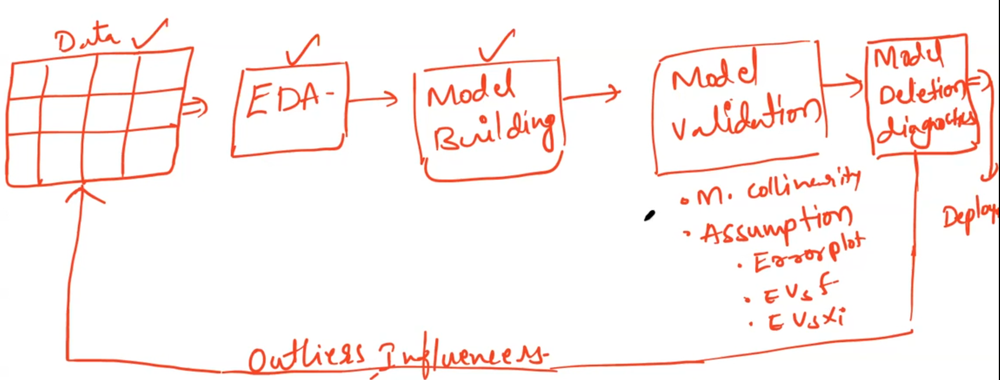

##Model Validation Techniques

image.png

**ei VS Yi cap(fitted value) plot** : will be used to check for linear relation, constant variance.

*   If relation is non-linear, U-shaped patttern appears.
*   If error variance is non constant, funnel shaped pattern appears.
*   If assumptions are met, random cloud of points appear



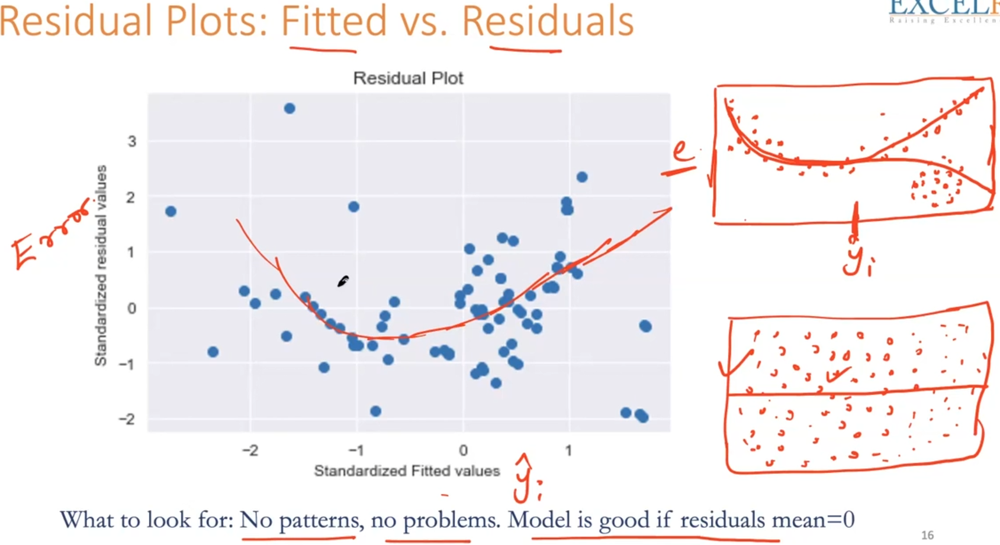

**ei VS Xi(independent variable) plot** : will be used to check for linear relation, constant variance.
*   If relation is non-linear, U-shaped patttern appears.
*   If error variance is non constant, funnel shaped pattern appears.
*   If assumptions are met, random cloud of points appear

   

In the chart Y and Fitted vs X, if the points are perfectly overlapping over each other, then the error is 0. If there are gaps between MPG and fitted, greater the gaps higher the errors the model is producing.


In the Residuals versus VOL plot, if there is a pattern in the data points, then x needs to be transformed.

Some transformation examples are -
x², log x, 1/x, 1/x², underscore x, 1/underscore x.


The partial regression plot and CCPR (Component and Component Plus Residual) Plot tells about how important the component is with respect to Y. The higher the slope the more important is the component.



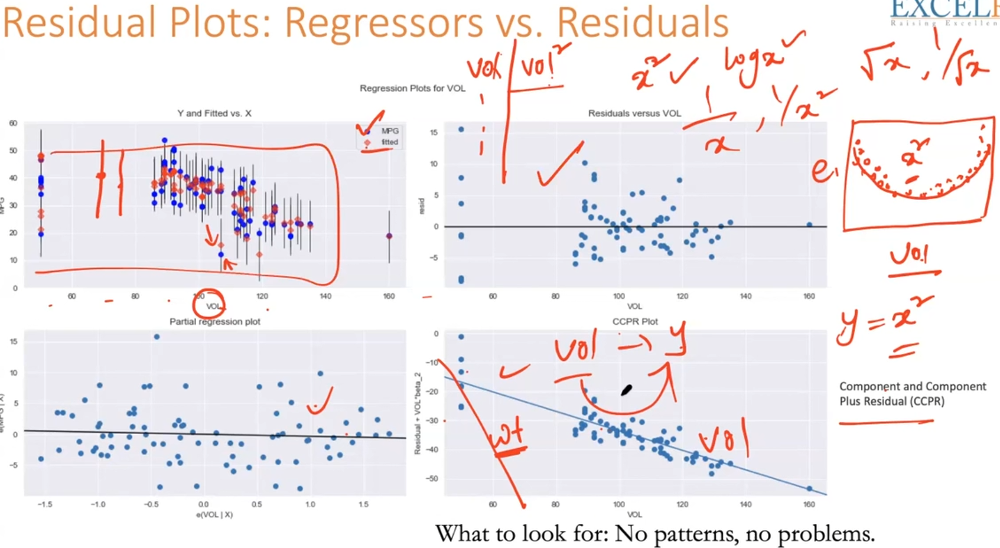

**Q-Q Plot** : Plot of errors to check errors are normally distributed


If the data points are falling on the solid red line then the errors are normally distributed.

If the data points are falling within the dotted red lines then we can say that the errors are following normal distribution with 95% confidence interval

If the data points are outside the dotted lines then the errors are not following normal distribution and the model needs some correction.

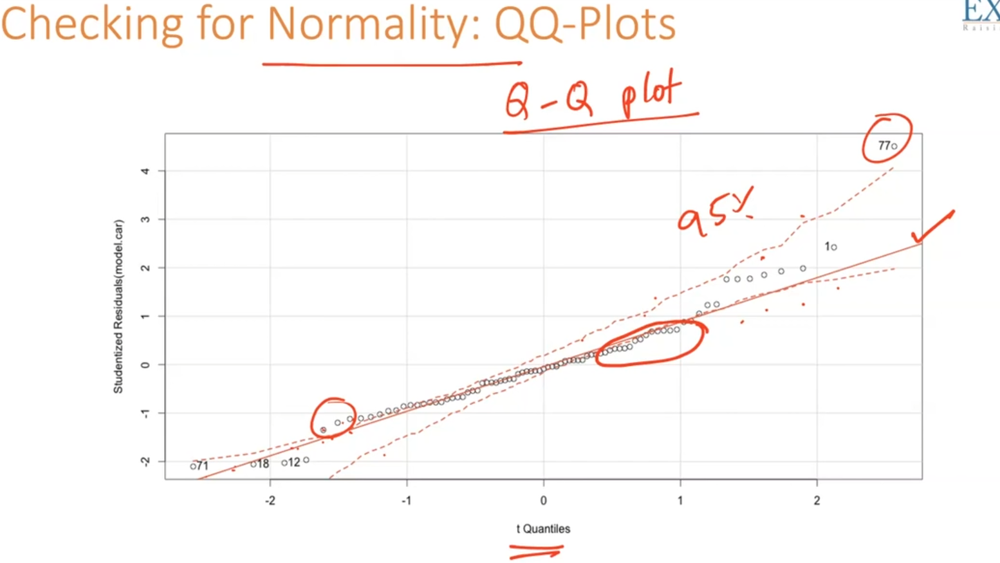

##Model Deletion Diagnostics -




The regression line slope should be decided by the majority of the data points.
If there are outliers/influencers in the data set then the regression line will be influenced, therefore we need to identify and remove them.



~**Cook's Distance** measures the difference between the *regression coefficients* obtained from *the full data and the regression coefficients obtained by deletion the ith observation*,or equivalently, the difference between the fitted values obtained from the full data and the fitted values obtained by deleting the ith observation.

**If cook's distance score is >=1**, then the data point is an influencer.

~**Hat-points/Leverage value/ Infuence** of an observation measures the influence of that observation on the overall fit of the regression function.

Leverage value of more than **3(k+1)/n** is treated as highly influential observation, where k is the number of features in the model and n is the sample size.

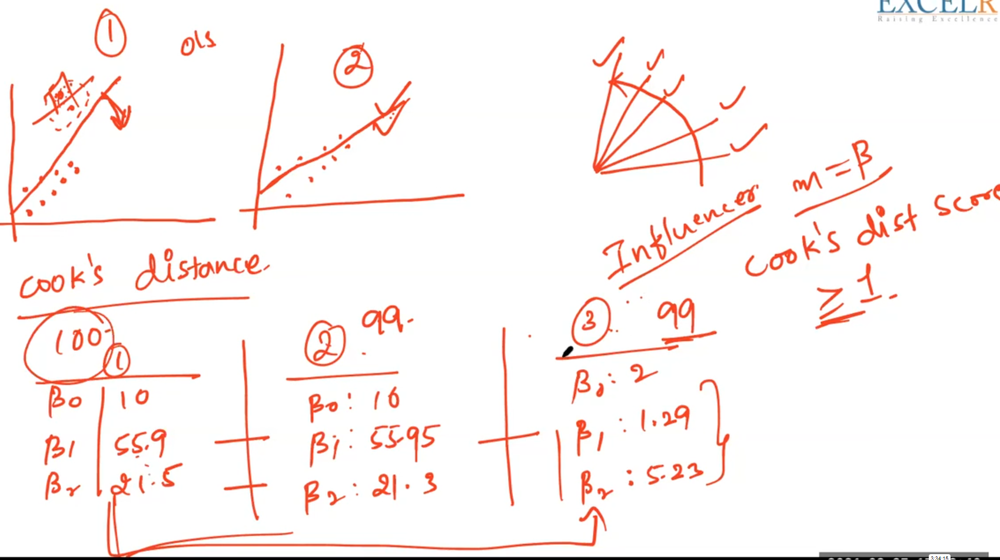

Methods to detect outliers -

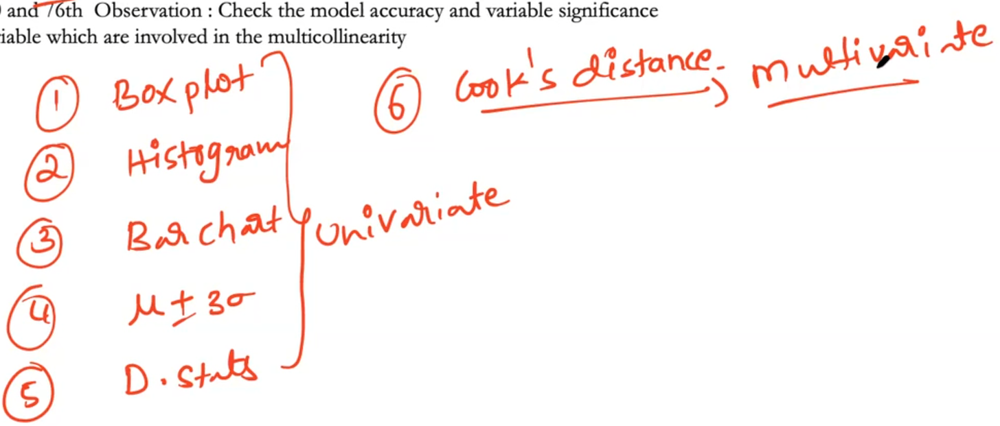

#Multiple Linear Regression Code

###Importing Libraries and Dataset

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.regressionplots import influence_plot
import statsmodels.formula.api as smf
import numpy as np

In [ ]:
#Read the data
cars = pd.read_csv("Cars.csv")
cars.head()

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149


In [ ]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81 entries, 0 to 80
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   HP      81 non-null     int64  
 1   MPG     81 non-null     float64
 2   VOL     81 non-null     int64  
 3   SP      81 non-null     float64
 4   WT      81 non-null     float64
dtypes: float64(3), int64(2)
memory usage: 3.3 KB


In [ ]:
#Check for missing values
cars.isna().sum()

HP     0
MPG    0
VOL    0
SP     0
WT     0
dtype: int64

In [ ]:
cars.corr()

,HP,MPG,VOL,SP,WT
HP,1.000000,-0.725038,0.077459,0.973848,0.076513
MPG,-0.725038,1.000000,-0.529057,-0.687125,-0.526759
VOL,0.077459,-0.529057,1.000000,0.102170,0.999203
SP,0.973848,-0.687125,0.102170,1.000000,0.102439
WT,0.076513,-0.526759,0.999203,0.102439,1.000000


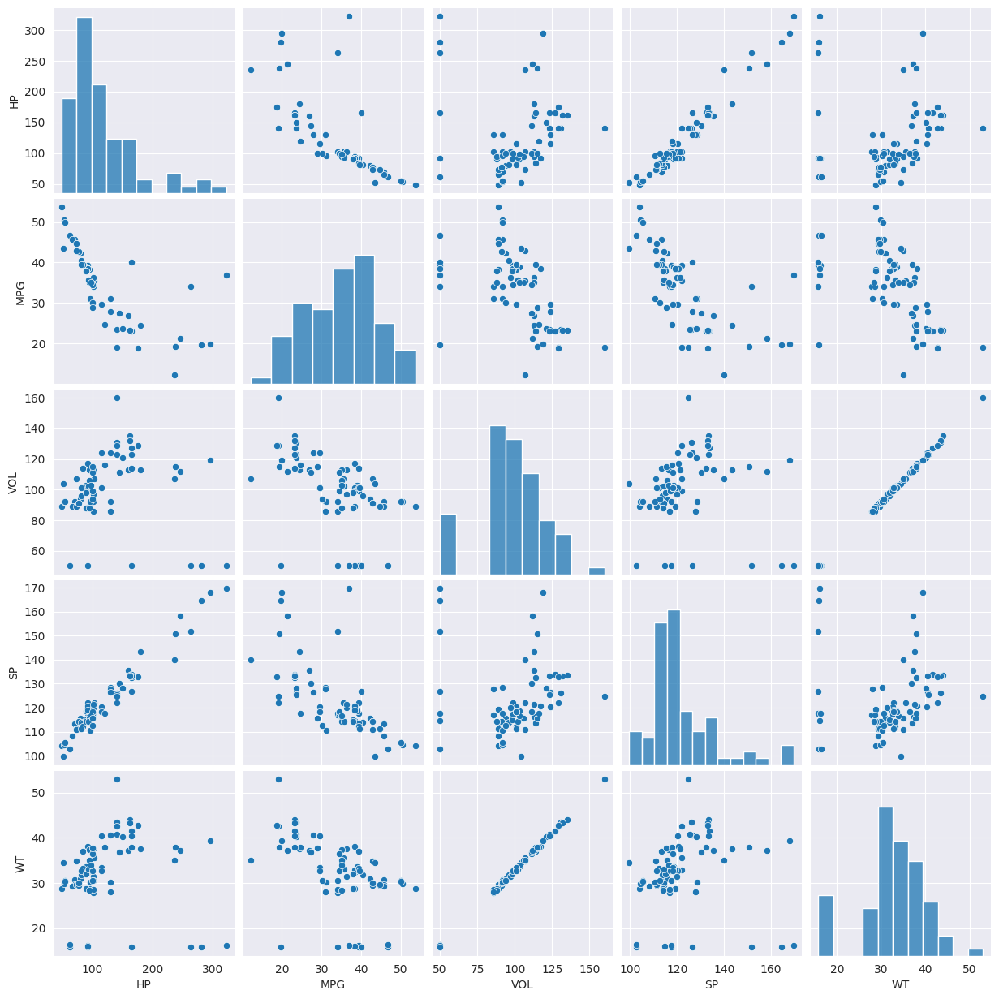

In [ ]:
#Format the plot backgroud and scatter plots for all the variables
sns.set_style(style='darkgrid')
sns.pairplot(cars)

In [ ]:
#Build model
model = smf.ols('MPG~WT+VOL+SP+HP',data=cars).fit()

In [ ]:
#Coefficients
model.params

Intercept    30.677336
WT            0.400574
VOL          -0.336051
SP            0.395627
HP           -0.205444
dtype: float64

In [ ]:
#T and p values
print(model.tvalues, "\n", model.pvalues)

Intercept    2.058841
WT           0.236541
VOL         -0.590970
SP           2.499880
HP          -5.238735
dtype: float64 
 Intercept    0.042936
WT           0.813649
VOL          0.556294
SP           0.014579
HP           0.000001
dtype: float64


###Difference b/w r square and r squared adjusted

r square values gives us the accuracy of the model.
In order to increase the r square value of the model, we can add another variable to the equation, which will increase the r square value, however incase of r square adjusted, if the variable is revelant then its value will increase, however if it is irrevelant, then it will decrease.

In [ ]:
#r squared values
(model.rsquared,model.rsquared_adj)

(0.7705372737359842, 0.7584602881431413)

###Simple Linear Regression Models

In [ ]:
ml_v = smf.ols('MPG~VOL',data=cars).fit()
#t and p-values
print(ml_v.tvalues,'\n',ml_v.pvalues)

Intercept    14.106056
VOL          -5.541400
dtype: float64 
 Intercept    2.753815e-23
VOL          3.822819e-07
dtype: float64


In [ ]:
ml_w = smf.ols('MPG~WT',data=cars).fit()
#t and p-values
print(ml_w.tvalues,'\n',ml_w.pvalues)

Intercept    14.248923
WT           -5.508067
dtype: float64 
 Intercept    1.550788e-23
WT           4.383467e-07
dtype: float64


In [ ]:
ml_wv = smf.ols('MPG~WT+VOL',data=cars).fit()
#t and p-values
print(ml_wv.tvalues,'\n',ml_wv.pvalues)

Intercept    12.545736
WT            0.489876
VOL          -0.709604
dtype: float64 
 Intercept    2.141975e-20
WT           6.255966e-01
VOL          4.800657e-01
dtype: float64


###Calc. VIF

In [ ]:
rsq_hp = smf.ols('HP~WT+VOL+SP',data =cars).fit().rsquared
vif_hp = 1/(1-rsq_hp)

rsq_wt = smf.ols('WT~HP+VOL+SP',data =cars).fit().rsquared
vif_wt = 1/(1-rsq_wt)

rsq_vol = smf.ols('VOL~WT+HP+SP',data =cars).fit().rsquared
vif_vol = 1/(1-rsq_vol)

rsq_sp = smf.ols('SP~WT+VOL+HP',data =cars).fit().rsquared
vif_sp = 1/(1-rsq_sp)

#Storing vif values in a data frame
d1 = {'Variables':['HP','WT','VOL','SP'],'VIF':[vif_hp,vif_wt,vif_vol,vif_sp]}
Vif_frame =pd.DataFrame(d1)
Vif_frame

,Variables,VIF
0,HP,19.926589
1,WT,639.533818
2,VOL,638.806084
3,SP,20.007639


###Residual Analysis

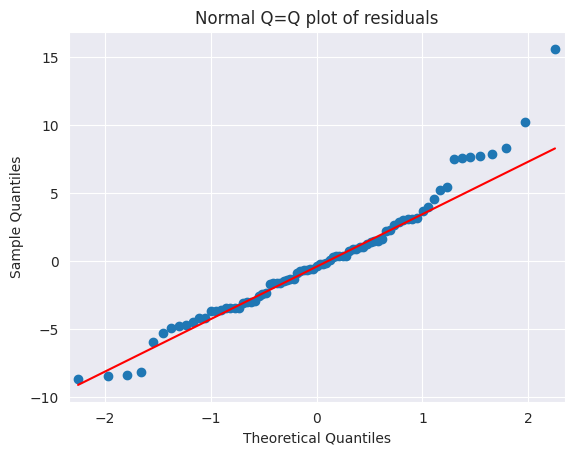

In [ ]:
#Test for Normality Of Residuals (Q-Q Plot)
import statsmodels.api as sm
qqplot=sm.qqplot(model.resid,line='q') # line = 45 to draw the diagonal line
plt.title("Normal Q=Q plot of residuals")
plt.show()

In [ ]:
list(np.where(model.resid>10))

[array([ 0, 76])]

In [ ]:
#Residual Plot for Homoscedasticity (Ei VS Y-fitted)

In [ ]:
def get_standardized_values(vals):
  return (vals - vals.mean())/vals.std()

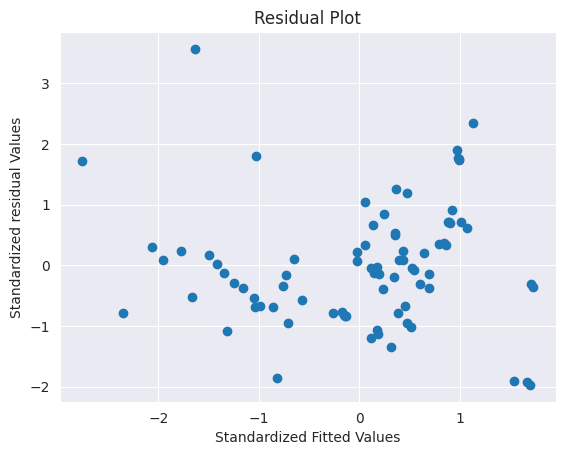

In [ ]:
plt.scatter(get_standardized_values(model.fittedvalues),
            get_standardized_values(model.resid))

plt.title("Residual Plot")
plt.xlabel("Standardized Fitted Values")
plt.ylabel("Standardized residual Values")
plt.show()

In [ ]:
#Residual Vs Regressors (Ei VS Xi)

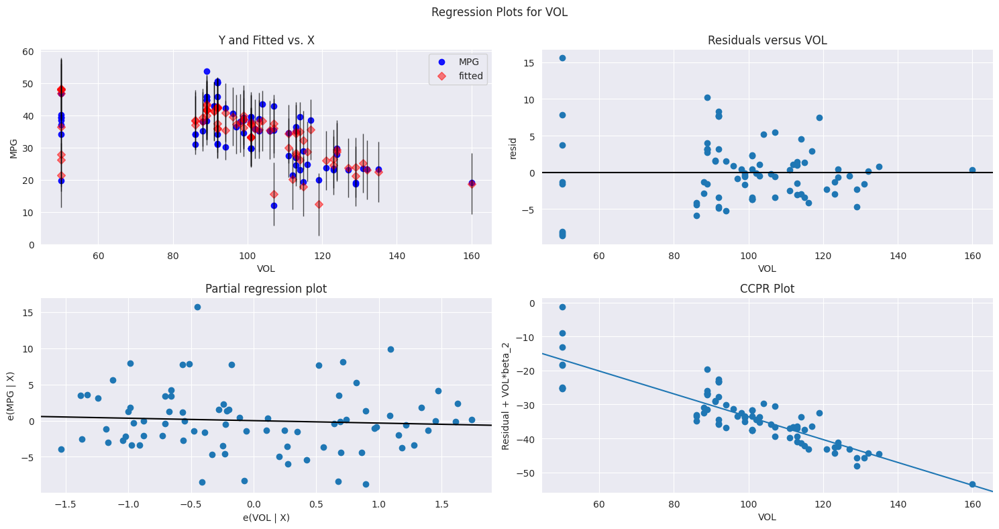

In [ ]:
fig=plt.figure(figsize=(15,8))
fig=sm.graphics.plot_regress_exog(model,"VOL",fig=fig)
plt.show()

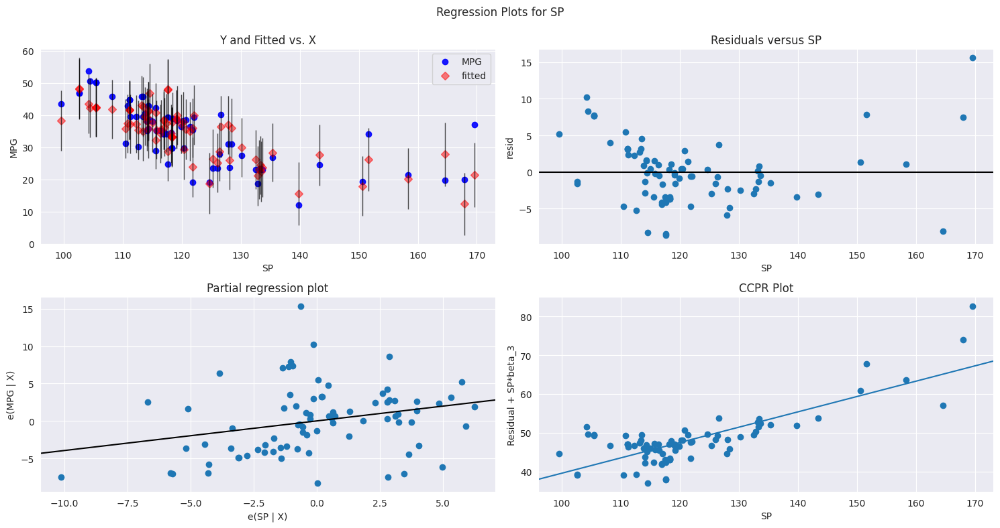

In [ ]:
fig=plt.figure(figsize=(15,8))
fig=sm.graphics.plot_regress_exog(model,"SP",fig=fig)
plt.show()

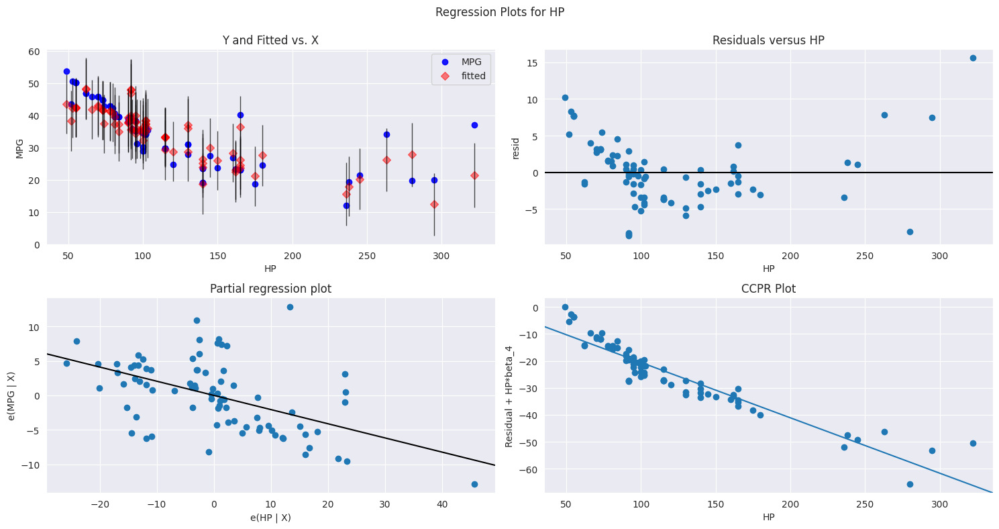

In [ ]:
fig=plt.figure(figsize=(15,8))
fig=sm.graphics.plot_regress_exog(model,"HP",fig=fig)
plt.show()

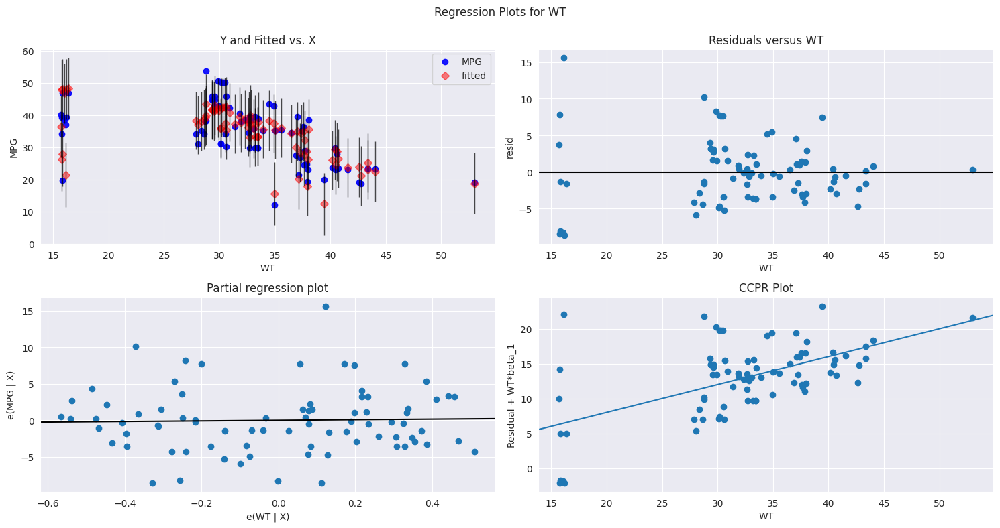

In [ ]:
fig=plt.figure(figsize=(15,8))
fig=sm.graphics.plot_regress_exog(model,"WT",fig=fig)
plt.show()

###Model Deletion Diagnostics

In [ ]:
#Cook's Distance

In [ ]:
model_influence = model.get_influence()
(c, _) = model_influence.cooks_distance

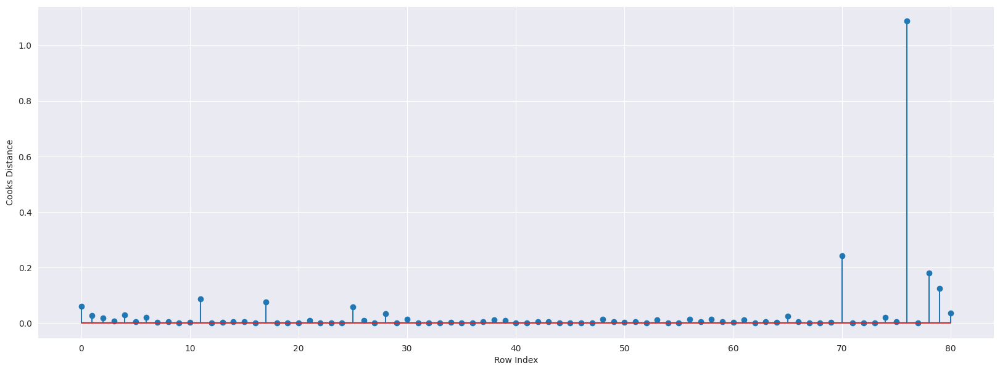

In [ ]:
#Plot the influencers values using stem plot
fig= plt.subplots(figsize= (20,7))
plt.stem(np.arange(len(cars)),np.round(c,3))
plt.xlabel('Row Index')
plt.ylabel('Cooks Distance')
plt.show()

In [ ]:
#index and value of influencer where c is more than .5
(np.argmax(c),np.max(c))

(76, 1.0865193998179699)

###High Influence points

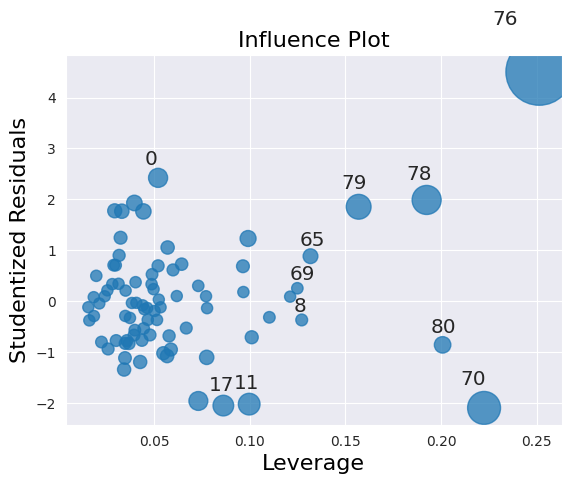

In [ ]:
from statsmodels.graphics.regressionplots import influence_plot
influence_plot(model)
plt.show()

In [ ]:
k=cars.shape[1]
n=cars.shape[0]
leverage_cutoff = 3*((k+1)/n)

In [ ]:
leverage_cutoff

0.2222222222222222

In [ ]:
#From the above plot it is evident that the 70th and 76th obs. are the influencers

In [ ]:
cars[cars.index.isin([70,76])]

,HP,MPG,VOL,SP,WT
70,280,19.678507,50,164.598513,15.823060
76,322,36.900000,50,169.598513,16.132947


In [ ]:
#See the difference in HP and Other variable values
cars.head()

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149


###Improving the model

In [ ]:
#Load the data
cars_new = pd.read_csv("Cars.csv")

In [ ]:
#Discard the data points which are influencers and reassign the row number (reset_index())
cars1=cars_new.drop(cars_new.index[[70,76]],axis=0).reset_index()

In [ ]:
cars1

In [ ]:
#Drop the original index
cars1=cars1.drop(['index'],axis=1)

In [ ]:
cars1

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...
74,175,18.762837,129,132.864163,42.778219
75,238,19.197888,115,150.576579,37.923113
76,263,34.000000,50,151.598513,15.769625
77,295,19.833733,119,167.944460,39.423099


##Build Model

In [ ]:
#Exclude variable "WT" and generate R-squared and AIC values
final_ml_v = smf.ols('MPG~VOL+SP+HP',data=cars1).fit()

In [ ]:
(final_ml_v.rsquared,final_ml_v.aic)

(0.8161692010376008, 446.1172263944772)

In [ ]:
#Exclude variable "VOL" and generate R-squared and AIC values
final_ml_w = smf.ols('MPG~WT+SP+HP',data=cars1).fit()

In [ ]:
(final_ml_w.rsquared,final_ml_w.aic)

(0.8160034320495303, 446.1884323575032)

Comparing above R-square and AIC Values, model'final_ml_v' has high R-square and loc AIC value hence include variable 'VOL' so that multi collinearity problem would be resolved.

###Cooks Distance

Checking again if there any other outliers

In [ ]:
model_influence_v = final_ml_v.get_influence()
(c_V, _) = model_influence_v.cooks_distance

Text(0, 0.5, 'Cooks Distance')

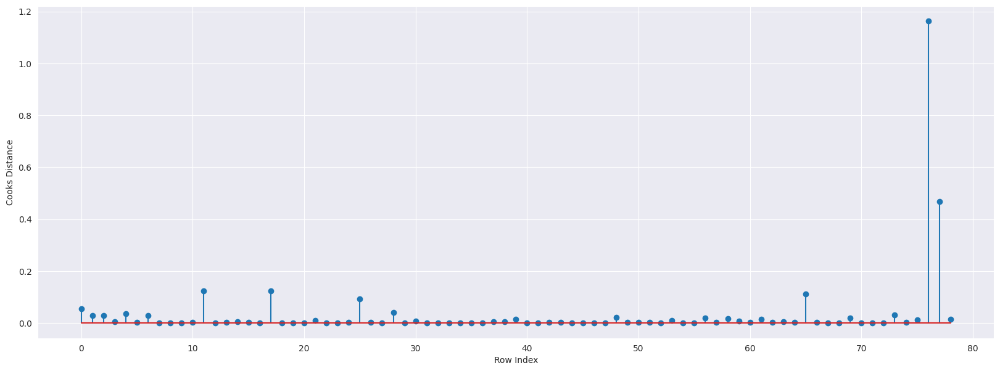

In [ ]:
fig=plt.subplots(figsize=(20,7))
plt.stem(np.arange(len(cars1)),np.round(c_V,3));
plt.xlabel('Row Index')
plt.ylabel('Cooks Distance')

In [ ]:
#index of the data points where c is more than .5
(np.argmax(c_V),np.max(c_V))

(76, 1.1629387469135182)

In [ ]:
#Drop 76 and 77 observation also to be on a safer side
car2=cars1.drop(cars1.index[[76,77]],axis=0)

In [ ]:
car2

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...
72,140,19.086341,160,124.715241,52.997752
73,140,19.086341,129,121.864163,42.618698
74,175,18.762837,129,132.864163,42.778219
75,238,19.197888,115,150.576579,37.923113


In [ ]:
#Reset the index and re-arrange the row values
car3=car2.reset_index()

In [ ]:
Car4=car3.drop(['index'],axis=1)

In [ ]:
Car4

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...
72,140,19.086341,160,124.715241,52.997752
73,140,19.086341,129,121.864163,42.618698
74,175,18.762837,129,132.864163,42.778219
75,238,19.197888,115,150.576579,37.923113


In [ ]:
#Build the model on the new data
final_ml_V=smf.ols('MPG~VOL+SP+HP',data=Car4).fit()

In [ ]:
#Again check for influencers
model_influence_V=final_ml_V.get_influence()
(C_V,_) = model_influence_V.cooks_distance

Text(0, 0.5, 'Cooks Distance')

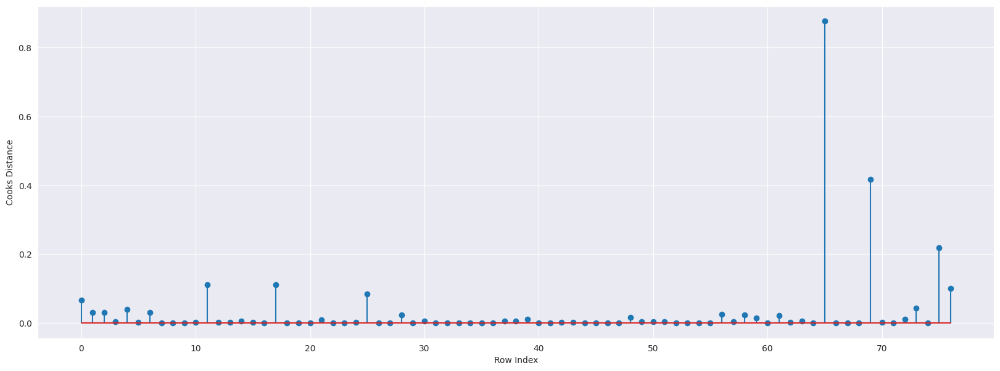

In [ ]:
fig=plt.subplots(figsize=(20,7))
plt.stem(np.arange(len(Car4)),np.round(C_V,3));
plt.xlabel("Row Index")
plt.ylabel("Cooks Distance")

In [ ]:
#index of the data points where c is more than .5
(np.argmax(C_V),np.max(C_V))

(65, 0.8774556986296674)

###Since the value is <1, we can stop the diagnostic process and finalize the model

In [ ]:
#Check the accuracy of the model
final_ml_V=smf.ols('MPG~VOL+SP+HP',data=Car4).fit()

In [ ]:
(final_ml_V.rsquared,final_ml_V.aic)

(0.8669636111859063, 409.4153062719508)

##Predicting for New data

In [ ]:
#New data for prediction
new_data =pd.DataFrame({'HP':40,'VOL':95,'SP':102,'WT':35},index=[1])

In [ ]:
new_data

,HP,VOL,SP,WT
1,40,95,102,35


In [ ]:
final_ml_V.predict(new_data)

1    46.035594
dtype: float64

#From the Start

Data Science By Srinivas > Logistic Regression, Clustering-Hierarchical Clustering > Logistic Regression, Clustering-Hierarchical Clustering


'''
Data Science By Srinivas >
Logistic Regression, Clustering-Hierarchical Clustering >
 Logistic Regression, Clustering-Hierarchical Clustering

 @55:42
 '''